In [1]:
#quickstart
from pathlib import Path
import pandas as pd
from bids import BIDSLayout
from joblib import Parallel, delayed
import nilearn
import nibabel as nib
import nltools.prefs as prf
from nilearn import datasets, image, plotting, input_data
from nilearn.masking import apply_mask
from nilearn.image import resample_to_img
from nilearn.image import concat_imgs, index_img
import numpy as np
import matplotlib.pylab as plt

import rpy2
from rpy2.robjects.packages import importr
from pymer4 import Lmer
psych = importr('psych')


import rpy2.robjects as ro
from rpy2.robjects import pandas2ri

from rpy2.robjects.conversion import localconverter

import os
import glob
import seaborn as sns
from nltools.data import Brain_Data, Design_Matrix, Adjacency
from nltools.mask import expand_mask, roi_to_brain
from nltools.stats import zscore
from scipy.stats import binom, ttest_1samp
from sklearn.metrics import pairwise_distances
from nltools.stats import fdr, one_sample_permutation
from copy import deepcopy
from nltools.utils import get_anatomical
import nltools.plotting as nlplt
from datetime import date
from joblib import Parallel, delayed

from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA

from nilearn.input_data import NiftiMapsMasker,NiftiLabelsMasker
from nilearn.connectome import ConnectivityMeasure

import sys
import pandas as pd
import rpy2
from rpy2.robjects.packages import importr
from pymer4 import Lmer
psych = importr('psych')
import numpy as np

import rpy2.robjects as ro
from rpy2.robjects import pandas2ri

from rpy2.robjects.conversion import localconverter

import os
import glob
import seaborn as sns
from statistics import mean
import matplotlib.style as style

#dat_paths = pd.read_csv('/data/MBDU/midla/notebooks/campcc/dat_paths_11272019.csv') 
#atlas = image.load_img('/data/MBDU/midla/notebooks/campcc/hox_msdl_atlas.nii.gz')
#sub1 = image.load_img('/data/MBDU/midla/data/derivatives/fmriprep/rn_aroma_20190910_2mm/sub-20900/out/fmrip

%matplotlib inline
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.max_colwidth', 500)
pd.set_option('display.width', 1000)

from IPython.core.display import display, HTML
display(HTML("<style>"
    + "#notebook { padding-top:0px !important; } " 
    + ".container { width:100% !important; } "
    + ".end_space { min-height:0px !important; } "
    + "</style>"))


/gpfs/gsfs11/users/MBDU/midla/env/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


In [2]:
#dat_paths = pd.read_csv('/data/MBDU/midla/data/derivatives/midla/primary_20200325/for_chris_svpair.csv')
dat_paths = pd.read_csv('/data/MBDU/midla/data/derivatives/midla/primary_20200325/for_chris_svpair.csv')

In [7]:
pd.read_csv(dat_paths.confounds_path[0],sep='\t')

,csf,csf_derivative1,csf_power2,csf_derivative1_power2,white_matter,white_matter_derivative1,white_matter_derivative1_power2,white_matter_power2,global_signal,global_signal_derivative1,global_signal_power2,global_signal_derivative1_power2,std_dvars,dvars,framewise_displacement,rmsd,t_comp_cor_00,t_comp_cor_01,t_comp_cor_02,t_comp_cor_03,t_comp_cor_04,t_comp_cor_05,a_comp_cor_00,a_comp_cor_01,a_comp_cor_02,a_comp_cor_03,a_comp_cor_04,a_comp_cor_05,a_comp_cor_06,a_comp_cor_07,a_comp_cor_08,a_comp_cor_09,a_comp_cor_10,a_comp_cor_11,a_comp_cor_12,a_comp_cor_13,a_comp_cor_14,a_comp_cor_15,a_comp_cor_16,a_comp_cor_17,a_comp_cor_18,a_comp_cor_19,a_comp_cor_20,a_comp_cor_21,a_comp_cor_22,a_comp_cor_23,a_comp_cor_24,a_comp_cor_25,a_comp_cor_26,a_comp_cor_27,a_comp_cor_28,a_comp_cor_29,a_comp_cor_30,a_comp_cor_31,a_comp_cor_32,a_comp_cor_33,a_comp_cor_34,a_comp_cor_35,a_comp_cor_36,a_comp_cor_37,a_comp_cor_38,a_comp_cor_39,a_comp_cor_40,a_comp_cor_41,a_comp_cor_42,a_comp_cor_43,a_comp_cor_44,a_comp_cor_45,a_comp_cor_46,a_comp_cor_47,a_comp_cor_48,a_comp_cor_49,a_comp_cor_50,a_comp_cor_51,a_comp_cor_52,a_comp_cor_53,a_comp_cor_54,a_comp_cor_55,a_comp_cor_56,a_comp_cor_57,a_comp_cor_58,a_comp_cor_59,a_comp_cor_60,a_comp_cor_61,a_comp_cor_62,a_comp_cor_63,a_comp_cor_64,a_comp_cor_65,a_comp_cor_66,a_comp_cor_67,a_comp_cor_68,a_comp_cor_69,a_comp_cor_70,a_comp_cor_71,a_comp_cor_72,a_comp_cor_73,a_comp_cor_74,a_comp_cor_75,a_comp_cor_76,a_comp_cor_77,a_comp_cor_78,a_comp_cor_79,a_comp_cor_80,a_comp_cor_81,a_comp_cor_82,a_comp_cor_83,a_comp_cor_84,a_comp_cor_85,a_comp_cor_86,a_comp_cor_87,a_comp_cor_88,a_comp_cor_89,a_comp_cor_90,a_comp_cor_91,a_comp_cor_92,a_comp_cor_93,a_comp_cor_94,a_comp_cor_95,a_comp_cor_96,a_comp_cor_97,a_comp_cor_98,a_comp_cor_99,a_comp_cor_100,a_comp_cor_101,a_comp_cor_102,a_comp_cor_103,a_comp_cor_104,a_comp_cor_105,a_comp_cor_106,a_comp_cor_107,a_comp_cor_108,a_comp_cor_109,a_comp_cor_110,a_comp_cor_111,a_comp_cor_112,a_comp_cor_113,a_comp_cor_114,a_comp_cor_115,a_comp_cor_116,a_comp_cor_117,a_comp_cor_118,a_comp_cor_119,a_comp_cor_120,a_comp_cor_121,a_comp_cor_122,a_comp_cor_123,a_comp_cor_124,a_comp_cor_125,a_comp_cor_126,a_comp_cor_127,a_comp_cor_128,a_comp_cor_129,a_comp_cor_130,a_comp_cor_131,a_comp_cor_132,a_comp_cor_133,a_comp_cor_134,a_comp_cor_135,a_comp_cor_136,a_comp_cor_137,a_comp_cor_138,a_comp_cor_139,a_comp_cor_140,a_comp_cor_141,a_comp_cor_142,a_comp_cor_143,a_comp_cor_144,a_comp_cor_145,a_comp_cor_146,a_comp_cor_147,a_comp_cor_148,a_comp_cor_149,a_comp_cor_150,a_comp_cor_151,a_comp_cor_152,a_comp_cor_153,a_comp_cor_154,a_comp_cor_155,a_comp_cor_156,a_comp_cor_157,a_comp_cor_158,a_comp_cor_159,a_comp_cor_160,a_comp_cor_161,a_comp_cor_162,a_comp_cor_163,a_comp_cor_164,a_comp_cor_165,a_comp_cor_166,a_comp_cor_167,a_comp_cor_168,a_comp_cor_169,a_comp_cor_170,a_comp_cor_171,a_comp_cor_172,a_comp_cor_173,a_comp_cor_174,a_comp_cor_175,a_comp_cor_176,a_comp_cor_177,a_comp_cor_178,a_comp_cor_179,a_comp_cor_180,a_comp_cor_181,a_comp_cor_182,a_comp_cor_183,a_comp_cor_184,a_comp_cor_185,a_comp_cor_186,a_comp_cor_187,a_comp_cor_188,a_comp_cor_189,a_comp_cor_190,a_comp_cor_191,a_comp_cor_192,a_comp_cor_193,a_comp_cor_194,a_comp_cor_195,a_comp_cor_196,a_comp_cor_197,a_comp_cor_198,a_comp_cor_199,a_comp_cor_200,a_comp_cor_201,a_comp_cor_202,a_comp_cor_203,a_comp_cor_204,a_comp_cor_205,a_comp_cor_206,a_comp_cor_207,a_comp_cor_208,a_comp_cor_209,a_comp_cor_210,a_comp_cor_211,a_comp_cor_212,a_comp_cor_213,a_comp_cor_214,a_comp_cor_215,a_comp_cor_216,a_comp_cor_217,a_comp_cor_218,cosine00,cosine01,cosine02,cosine03,cosine04,cosine05,cosine06,cosine07,cosine08,cosine09,non_steady_state_outlier00,non_steady_state_outlier01,non_steady_state_outlier02,non_steady_state_outlier03,trans_x,trans_x_derivative1,trans_x_derivative1_power2,trans_x_power2,trans_y,trans_y_derivative1,trans_y_power2,trans_y_derivative1_power2,trans_z,trans_z_derivative1,trans_z_derivative1_power2,trans_z_power2,rot_x,rot_x_derivative1,rot_x_power2,rot

In [16]:
dat_paths.columns

Index(['subject', 'session', 'task', 'run', 'sv_pair', 'total_n_session', 'scanner', 'acq_date', 'confounds_path', 'image_path', 'mask_path'], dtype='object')

In [3]:
# basc = datasets.fetch_atlas_basc_multiscale_2015(version='asym')
# basc64 = basc['scale064']
# atlas = image.load_img(basc64)
# atlas_dat = atlas.get_fdata()
# uvs = np.unique(atlas_dat)
# atlas_in_4d = []
# for uv in uvs:
#     atlas_in_4d.append((atlas_dat == uv).astype(int))
# atlas_4d_dat = np.array(atlas_in_4d)
# atlas_dfs = []
# for ii, aa in enumerate(atlas_in_4d):
#     row = {}
#     row['orig_ind'] = ii
#     row['x_min'], row['y_min'], row['z_min'] = np.array(np.where(aa)).min(1)
#     row['x_max'], row['y_max'], row['z_max'] = np.array(np.where(aa)).max(1)
#     row['x_mean'], row['y_mean'], row['z_mean'] = np.array(np.where(aa)).mean(1)
#     atlas_dfs.append(row)
# atlas_dfs = pd.DataFrame(atlas_dfs)
# atlas_df = atlas_dfs.sort_values('y_min', ascending=False).reset_index(drop=True).reset_index().rename(columns={'index':'new_index'})
# atlas_df['match_ind'] = atlas_df.orig_ind + 1000
# atlas_df['new_index'] +=1
# atlas_df.loc[atlas_df['match_ind'] == 1000, 'new_index']=0
# sorted_dat = atlas_dat + 1000
# for ii, row in atlas_df.iterrows():
#     sorted_dat[sorted_dat == row.match_ind] = row.new_index
# sorted_atlas = image.new_img_like(atlas, sorted_dat, atlas.affine, atlas.header)
# uvs = np.unique(sorted_dat)
# atlas_in_4d = np.zeros(list(atlas.shape) + [len(uvs)-1], dtype=int)
# for ii, uv in enumerate(uvs):
#     if uv != 0:
#         atlas_in_4d[:,:,:,ii-1] = (sorted_dat == uv).astype(int)
# sorted_4d_img = image.new_img_like(atlas,atlas_in_4d, affine=atlas.affine,copy_header=True)


# row = dat_paths.iloc[0]
    
# img = image.load_img(row.image_path)
# regions_extracted_img = resample_to_img(sorted_4d_img,img,interpolation='nearest')

In [5]:
#regions_extracted_img.to_filename('/data/MBDU/midla/notebooks/campcc/test_retest/mid_rs_basc_atlas_071820.nii.gz')

In [9]:
#regions_extracted_img = image.load_img('/data/MBDU/midla/notebooks/campcc/test_retest/mid_rs_basc_atlas_071820.nii.gz')

/gpfs/gsfs11/users/MBDU/midla/env/lib/python3.7/site-packages/nilearn/plotting/displays.py:98: UserWarning: No contour levels were found within the data range.
  **kwargs)


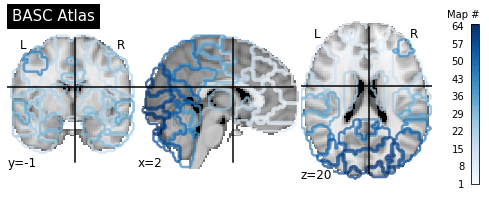

In [6]:
#plotting.plot_prob_atlas(regions_extracted_img, view_type='contours',cmap = 'Blues',colorbar=True, dim= 0,alpha=.7,title='BASC Atlas')

In [18]:
! export PATH=/data/MBDU/midla/env/bin:$PATH; python /data/MBDU/midla/notebooks/campcc/ts_extract.py /data/MBDU/midla/data/derivatives/midla/primary_20200325/for_chris_svpair.csv /data/MBDU/midla/notebooks/campcc/test_retest/mid_rs_basc_atlas_071820.nii.gz 0 ifc ccm

/data/MBDU/midla/env/lib/python3.7/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)
rs_cc_0
Extracting rest timeseries from row 0
/data/MBDU/midla/env/lib/python3.7/site-packages/nilearn/input_data/nifti_maps_masker.py:326: UserWarning: Persisting input arguments took 23.65s to run.
If this happens often in your code, it can cause performance problems 
(results will be correct in all cases). 
The reason for this is probably some large input arguments for a wrapped
 function (e.g. large strings).
THIS IS A JOBLIB ISSUE. If you can, kindly provide the joblib's team with an
 example so that they can fix the problem.
 

In [78]:
dat_paths

,subject,session,task,run,sv_pair,total_n_session,scanner,acq_date,confounds_path,image_path,mask_path
0,20900,1,mid,1,3TC__DV26.0_R01_1725.a__3TC__DV26.0_R03_1831.b,2,3TC,2018-07-28,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-20900/out/fmriprep/sub-20900/ses-01/func/sub-20900_ses-01_task-mid_run-1_desc-confounds_regressors.tsv,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-20900/out/fmriprep/sub-20900/ses-01/func/sub-20900_ses-01_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-20900/out/fmriprep/sub-20900/ses-01/func/sub-20900_ses-01_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-brain_mask.nii.gz
1,20900,4,mid,1,3TC__DV26.0_R01_1725.a__3TC__DV26.0_R03_1831.b,2,3TC,2019-08-06,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-20900/out/fmriprep/sub-20900/ses-04/func/sub-20900_ses-04_task-mid_run-1_desc-confounds_regressors.tsv,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-20900/out/fmriprep/sub-20900/ses-04/func/sub-20900_ses-04_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-20900/out/fmriprep/sub-20900/ses-04/func/sub-20900_ses-04_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-brain_mask.nii.gz
2,21111,1,mid,1,3TA__DV25.1_R01_1617.b__3TA__DV26.0_R03_1831.b,2,3TA,2017-10-28,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21111/out/fmriprep/sub-21111/ses-01/func/sub-21111_ses-01_task-mid_run-1_desc-confounds_regressors.tsv,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21111/out/fmriprep/sub-21111/ses-01/func/sub-21111_ses-01_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21111/out/fmriprep/sub-21111/ses-01/func/sub-21111_ses-01_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-brain_mask.nii.gz
3,21111,5,mid,1,3TA__DV25.1_R01_1617.b__3TA__DV26.0_R03_1831.b,2,3TA,2019-03-30,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21111/out/fmriprep/sub-21111/ses-05/func/sub-21111_ses-05_task-mid_run-1_desc-confounds_regressors.tsv,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21111/out/fmriprep/sub-21111/ses-05/func/sub-21111_ses-05_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21111/out/fmriprep/sub-21111/ses-05/func/sub-21111_ses-05_task-mid_run-1_space-MNI152NLin2009cAsym_res-2_desc-brain_mask.nii.gz
4,21748,1,mid,2,3TC__DV26.0_R01_1725.a__3TC__DV26.0_R03_1831.b,4,3TC,2018-11-10,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21748/out/fmriprep/sub-21748/ses-01/func/sub-21748_ses-01_task-mid_run-2_desc-confounds_regressors.tsv,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21748/out/fmriprep/sub-21748/ses-01/func/sub-21748_ses-01_task-mid_run-2_space-MNI152NLin2009cAsym_res-2_desc-preproc_bold.nii.gz,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21748/out/fmriprep/sub-21748/ses-01/func/sub-21748_ses-01_task-mid_run-2_space-MNI152NLin2009cAsym_res-2_desc-brain_mask.nii.gz
5,21748,2,mid,2,3TC__DV26.0_R01_1725.a__3TC__DV26.0_R03_1831.b,4,3TC,2019-03-23,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv20.1.0_20200528_2mm_clifix_noaroma/sub-21748/out/fmriprep/sub-21748/ses-02/func/sub-21748_ses-02_task-mid_run-2_desc-confounds_regressors.tsv,/data/MBDU/midla/data/derivatives/fmriprep/fmriprepv2

In [14]:
cfd_dict = {0:'cc',
           1:'ccm',
           2:'ccmp'}

In [15]:
cmd_list = []
atlas = '/data/MBDU/midla/notebooks/campcc/test_retest/mid_basc_atlas_071820.nii.gz'
dat_dir = '/data/MBDU/midla/data/derivatives/midla/primary_20200325/for_chris_svpair.csv'
i = 'rs'
cfd = cfd_dict[2]
for _,row in dat_paths.iterrows():
    cmd_list.append(f'! export PATH=/data/MBDU/midla/env/bin:$PATH; python ts_extract.py {dat_dir} {atlas} {_} {i} {cfd}')

In [68]:
cmd_list = []
atlas = '/data/MBDU/midla/notebooks/campcc/test_retest/mid_rs_basc_atlas_071820.nii.gz'
dat_dir = '/data/MBDU/midla/data/derivatives/midla/primary_20200325/for_chris_svpair.csv'
i = 'rs'
for j in cfd_dict:
    cfd = cfd_dict[j]
    for _,row in dat_paths.iterrows():
        cmd_list.append(f'! export PATH=/data/MBDU/midla/env/bin:$PATH; python ts_extract.py {dat_dir} {atlas} {_} {i} {cfd}')

In [17]:
#cmds = '\n'.join(cmd_list[0:5]) + '\n'+'\n'.join(cmd_list[600:605])
cmds = '\n'.join(cmd_list)
from pathlib import Path
swarm_file = Path('/data/MBDU/midla/notebooks/campcc/swarms/rs_ts_extract_ccmp.txt')
swarm_file.write_text(cmds)

run_name = 'rs_ts_extract_ccmp'
swarm_log_dir = '/data/MBDU/midla/notebooks/campcc/swarms/logs'

In [18]:
! swarm -f $swarm_file -g 25 -t 2 -b 15 --time 0:16:00 --logdir $swarm_log_dir --partition=quick --job-name $run_name

61559455


In [21]:
resdir = '/data/MBDU/midla/notebooks/campcc/test_retest/resting_state/subject_ts/'
metric = 'rs'
cfd_type = 'ccm'
rs_ts = []
for _,row in dat_paths.iterrows():
    rs_ts.append(pd.read_csv(f'{resdir}basc_ts_subject_{row.subject}_session_{row.session}_pair_{row.sv_pair}_metric_{metric}_cfds_{cfd_type}.csv').values)
correlation_measure = ConnectivityMeasure(kind='correlation')
correlation_matrices = correlation_measure.fit_transform(rs_ts)

In [22]:
icc_dat = pd.DataFrame()
corr_matrices = correlation_matrices
icc_dat['subject'] = ['']
icc_dat['session'] = ['']
icc_dat['pair'] = ['']
for i in range(corr_matrices.shape[1]):
    for j in range(corr_matrices.shape[2]):
        icc_dat['{}_{}'.format(i,j)] = [0.0]

if metric == 'rs':
    task = 'rest'
else:
    task = 'mid'
for _,row in dat_paths.iterrows():
#             corr = pd.read_csv(f'{corr_dir}/{metric}_cm_{row.subject}_session_{row.session}_run_{row.run}_task_{task}_cfd_{cfd_alph}.csv',header=None)
    corr = corr_matrices[_]
    newrow = []
    newrow.append('{}'.format(row.subject))
    newrow.append('{}'.format(row.session))
    newrow.append('{}'.format(row.sv_pair))
    for i in range(corr.shape[0]):
            for j in range(corr.shape[1]):
                newrow.append(corr[i][j])
    icc_dat.loc[_] = newrow

In [23]:
coldrop = []
for x in range(3,len(icc_dat.columns)):
    meas = icc_dat.columns[x].split('_')
    if int(meas[0]) <= int(meas[1]):
        coldrop.append(icc_dat.columns[x])
icc_dat = icc_dat.drop(columns=coldrop)
measure_iccs=[]

In [107]:
bin = []
x = 1
for _ in dat_paths.iterrows():
    bin.append(x)
    x = x*-1

In [172]:
df = icc_dat[0:2].loc[:, icc_dat.columns[1:2019]].drop(columns=['pair']).set_index(['session']).transpose()

In [57]:
#selection = icc_dat.loc[:, ['subject','session','pair', mc,'bin']].set_index(['pair','subject','bin','session']).unstack()
mc_res = psych.ICC(df, missing=False,alpha=.003671)

R[write to console]: boundary (singular) fit: see ?isSingular



In [56]:
df = icc_dat.drop_duplicates().loc[icc_dat.pair == pair].loc[:, ['subject', 'session', mc]].set_index(['subject', 'session']).unstack()

In [ ]:
measure_iccs = []
measure_cols = icc_dat.columns[3:]
measure_df = pd.DataFrame()
for pair in icc_dat.pair.unique():
    for mc in measure_cols:
        psych_dat = icc_dat.drop_duplicates().loc[icc_dat.pair == pair].loc[:, ['subject', 'session', mc]].set_index(['subject', 'session']).unstack()
        mc_res = psych.ICC(psych_dat, missing=False,alpha=.05)
        mc_res = mc_res[0].loc[['Single_random_raters', 'Single_fixed_raters']]
        mc_res['measure'] = mc
        mc_res['pair'] = pair
        measure_iccs.append(mc_res)
    measure_df = measure_df.append(pd.concat(measure_iccs))

#return pd.DataFrame(measure_iccs)
#measure_df = pd.DataFrame(measure_iccs)
measure_df.to_csv('/data/MBDU/midla/notebooks/campcc/test_retest/resting_state/icc_by_scan_pair_ccm.csv')

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSi

In [179]:
# measure_cols = icc_dat.columns[2:]
# measure_iccs=[]

# for _ in range(0,len(icc_dat),2):
#     psych_dat = icc_dat[_:(_+2)].loc[:, icc_dat.columns[1:2019]].drop(columns=['pair']).set_index(['session']).transpose()
#     mc_res = psych.ICC(psych_dat, missing=False,alpha=.05)
#     mc_res = mc_res[0].loc[['Single_random_raters', 'Single_fixed_raters']]
#     mc_res['subject'] = icc_dat.subject[_]
#     mc_res['measure'] = icc_dat.pair[_]
#     measure_iccs.append(mc_res)
# measure_iccs = pd.concat(measure_iccs)    

# #return pd.DataFrame(measure_iccs)
# measure_df = pd.DataFrame(measure_iccs)

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular

R[write to console]: boundary (singular) fit: see ?isSingular



In [181]:
icc_dat.shape

(568, 2020)

In [182]:
measure_df.to_csv('/data/MBDU/midla/notebooks/campcc/test_retest/resting_state/icc_by_pair.csv')

In [2]:
measure_df = pd.read_csv('/data/MBDU/midla/notebooks/campcc/test_retest/resting_state/icc_by_pair.csv')

In [4]:
measure_df = pd.read_csv('/data/MBDU/midla/notebooks/campcc/test_retest/resting_state/icc_by_scan_pair.csv')

In [8]:
measure_df.loc[measure_df.type == 'ICC2'].groupby('pair')[['ICC']].agg(['mean','std','count'])

ICC                 
                                                    mean       std  count
pair                                                                     
3TA__DV25.1_R01_1617.b__3TA__DV25.1_R01_1617.b  0.413495  0.196380   6048
3TA__DV25.1_R01_1617.b__3TA__DV26.0_R01_1725.a  0.392802  0.169218   4032
3TA__DV25.1_R01_1617.b__3TA__DV26.0_R03_1831.b  0.254753  0.322051  20160
3TA__DV26.0_R01_1725.a__3TA__DV26.0_R01_1725.a  0.511628  0.137169  14112
3TA__DV26.0_R01_1725.a__3TA__DV26.0_R03_1831.b  0.527889  0.130930  12096
3TA__DV26.0_R03_1831.b__3TA__DV26.0_R03_1831.b  0.486918  0.140026  16128
3TC__DV22.0_V02_1122.a__3TC__DV26.0_R01_1725.a  0.389586  0.262159   2016
3TC__DV22.0_V02_1122.a__3TC__DV26.0_R03_1831.b  0.457498  0.369408   8064
3TC__DV26.0_R01_1725.a__3TC__DV26.0_R01_1725.a  0.481180  0.099083  10080
3TC__DV26.0_R01_1725.a__3TC__DV26.0_R03_1831.b  0.505778  0.162794  22176
3TC__DV26.0_R03_1831.b__3TC__DV26.0_R03_1831.b  0.538860  0.117473  18144

In [9]:
row = dat_paths.iloc[0]

In [10]:
cfd = pd.read_csv(row.confounds_path, sep='\t',index_col=0)

In [12]:
cfd

,csf_derivative1,csf_power2,csf_derivative1_power2,white_matter,white_matter_derivative1,white_matter_derivative1_power2,white_matter_power2,global_signal,global_signal_derivative1,global_signal_power2,global_signal_derivative1_power2,std_dvars,dvars,framewise_displacement,rmsd,t_comp_cor_00,t_comp_cor_01,t_comp_cor_02,t_comp_cor_03,t_comp_cor_04,t_comp_cor_05,a_comp_cor_00,a_comp_cor_01,a_comp_cor_02,a_comp_cor_03,a_comp_cor_04,a_comp_cor_05,a_comp_cor_06,a_comp_cor_07,a_comp_cor_08,a_comp_cor_09,a_comp_cor_10,a_comp_cor_11,a_comp_cor_12,a_comp_cor_13,a_comp_cor_14,a_comp_cor_15,a_comp_cor_16,a_comp_cor_17,a_comp_cor_18,a_comp_cor_19,a_comp_cor_20,a_comp_cor_21,a_comp_cor_22,a_comp_cor_23,a_comp_cor_24,a_comp_cor_25,a_comp_cor_26,a_comp_cor_27,a_comp_cor_28,a_comp_cor_29,a_comp_cor_30,a_comp_cor_31,a_comp_cor_32,a_comp_cor_33,a_comp_cor_34,a_comp_cor_35,a_comp_cor_36,a_comp_cor_37,a_comp_cor_38,a_comp_cor_39,a_comp_cor_40,a_comp_cor_41,a_comp_cor_42,a_comp_cor_43,a_comp_cor_44,a_comp_cor_45,a_comp_cor_46,a_comp_cor_47,a_comp_cor_48,a_comp_cor_49,a_comp_cor_50,a_comp_cor_51,a_comp_cor_52,a_comp_cor_53,a_comp_cor_54,a_comp_cor_55,a_comp_cor_56,a_comp_cor_57,a_comp_cor_58,a_comp_cor_59,a_comp_cor_60,a_comp_cor_61,a_comp_cor_62,a_comp_cor_63,a_comp_cor_64,a_comp_cor_65,a_comp_cor_66,a_comp_cor_67,a_comp_cor_68,a_comp_cor_69,a_comp_cor_70,a_comp_cor_71,a_comp_cor_72,a_comp_cor_73,a_comp_cor_74,a_comp_cor_75,a_comp_cor_76,a_comp_cor_77,a_comp_cor_78,a_comp_cor_79,a_comp_cor_80,a_comp_cor_81,a_comp_cor_82,a_comp_cor_83,a_comp_cor_84,a_comp_cor_85,a_comp_cor_86,a_comp_cor_87,a_comp_cor_88,a_comp_cor_89,a_comp_cor_90,a_comp_cor_91,a_comp_cor_92,a_comp_cor_93,a_comp_cor_94,a_comp_cor_95,a_comp_cor_96,a_comp_cor_97,a_comp_cor_98,a_comp_cor_99,a_comp_cor_100,a_comp_cor_101,a_comp_cor_102,a_comp_cor_103,a_comp_cor_104,a_comp_cor_105,a_comp_cor_106,a_comp_cor_107,a_comp_cor_108,a_comp_cor_109,a_comp_cor_110,a_comp_cor_111,a_comp_cor_112,a_comp_cor_113,a_comp_cor_114,a_comp_cor_115,a_comp_cor_116,a_comp_cor_117,a_comp_cor_118,a_comp_cor_119,a_comp_cor_120,a_comp_cor_121,a_comp_cor_122,a_comp_cor_123,a_comp_cor_124,a_comp_cor_125,a_comp_cor_126,a_comp_cor_127,a_comp_cor_128,a_comp_cor_129,a_comp_cor_130,a_comp_cor_131,a_comp_cor_132,a_comp_cor_133,a_comp_cor_134,a_comp_cor_135,a_comp_cor_136,a_comp_cor_137,a_comp_cor_138,a_comp_cor_139,a_comp_cor_140,a_comp_cor_141,a_comp_cor_142,a_comp_cor_143,a_comp_cor_144,a_comp_cor_145,a_comp_cor_146,a_comp_cor_147,a_comp_cor_148,a_comp_cor_149,a_comp_cor_150,a_comp_cor_151,a_comp_cor_152,a_comp_cor_153,a_comp_cor_154,a_comp_cor_155,a_comp_cor_156,a_comp_cor_157,a_comp_cor_158,a_comp_cor_159,a_comp_cor_160,a_comp_cor_161,a_comp_cor_162,a_comp_cor_163,a_comp_cor_164,a_comp_cor_165,a_comp_cor_166,a_comp_cor_167,a_comp_cor_168,a_comp_cor_169,a_comp_cor_170,a_comp_cor_171,a_comp_cor_172,a_comp_cor_173,a_comp_cor_174,a_comp_cor_175,a_comp_cor_176,a_comp_cor_177,a_comp_cor_178,a_comp_cor_179,a_comp_cor_180,a_comp_cor_181,a_comp_cor_182,a_comp_cor_183,a_comp_cor_184,a_comp_cor_185,a_comp_cor_186,a_comp_cor_187,a_comp_cor_188,a_comp_cor_189,a_comp_cor_190,a_comp_cor_191,a_comp_cor_192,a_comp_cor_193,a_comp_cor_194,a_comp_cor_195,a_comp_cor_196,a_comp_cor_197,a_comp_cor_198,a_comp_cor_199,a_comp_cor_200,a_comp_cor_201,a_comp_cor_202,a_comp_cor_203,a_comp_cor_204,a_comp_cor_205,a_comp_cor_206,a_comp_cor_207,a_comp_cor_208,a_comp_cor_209,a_comp_cor_210,a_comp_cor_211,a_comp_cor_212,a_comp_cor_213,a_comp_cor_214,a_comp_cor_215,a_comp_cor_216,a_comp_cor_217,a_comp_cor_218,cosine00,cosine01,cosine02,cosine03,cosine04,cosine05,cosine06,cosine07,cosine08,cosine09,non_steady_state_outlier00,non_steady_state_outlier01,non_steady_state_outlier02,non_steady_state_outlier03,trans_x,trans_x_derivative1,trans_x_derivative1_power2,trans_x_power2,trans_y,trans_y_derivative1,trans_y_power2,trans_y_derivative1_power2,trans_z,trans_z_derivative1,trans_z_derivative1_power2,trans_z_power2,rot_x,rot_x_derivative1,rot_x_power2,rot_x_d

In [190]:
icc_dat.pair.value_counts()

3TC__DV26.0_R01_1725.a__3TC__DV26.0_R01_1725.a    100
3TA__DV26.0_R01_1725.a__3TA__DV26.0_R01_1725.a     92
3TA__DV26.0_R01_1725.a__3TA__DV26.0_R03_1831.b     84
3TC__DV26.0_R01_1725.a__3TC__DV26.0_R03_1831.b     72
3TA__DV26.0_R03_1831.b__3TA__DV26.0_R03_1831.b     64
3TC__DV26.0_R03_1831.b__3TC__DV26.0_R03_1831.b     60
3TA__DV25.1_R01_1617.b__3TA__DV26.0_R01_1725.a     40
3TA__DV25.1_R01_1617.b__3TA__DV25.1_R01_1617.b     36
3TC__DV22.0_V02_1122.a__3TC__DV26.0_R01_1725.a     12
3TA__DV25.1_R01_1617.b__3TA__DV26.0_R03_1831.b      4
3TC__DV22.0_V02_1122.a__3TC__DV26.0_R03_1831.b      4
Name: pair, dtype: int64

In [ ]:
bs_res.loc[bs_res['timeseries'] == 'concat_ifc'].groupby(['cfd','boot'])[['ICC']].mean().reset_index().groupby(['cfd']).agg(['mean', 'std', 'count'])